In [2]:
import stream as st

/home/spuccio/anaconda3/envs/env_stream/lib/python3.7/site-packages/rpy2/robjects/pandas2ri.py:17: FutureWarning: pandas.core.index is deprecated and will be removed in a future version.  The public classes are available in the top-level namespace.
  from pandas.core.index import Index as PandasIndex


In [2]:
adata = st.read('stream_result.1.pkl')

Working directory is already specified as './stream_result' 
To change working directory, please run set_workdir(adata,workdir=new_directory)


In [5]:
adata = st.read('/mnt/spuccio_hpcserver2/stream_result/stream_result2.pkl')

Working directory is already specified as './stream_result' 
To change working directory, please run set_workdir(adata,workdir=new_directory)


In [18]:
st.set_figure_params(dpi=80,style='white',figsize=[5.4,4.8],
                     rc={'image.cmap': 'viridis'})

In [7]:
import matplotlib.pyplot as plt
from matplotlib import rcParams
from matplotlib import colors

In [4]:
del adata.obs['tSNE_1']
del adata.obs['tSNE_2']
del adata.obs['celltype12_cond']
del adata.obs['RNA_snn_res.1.2']
del adata.obs['old.ident']

In [5]:
adata

AnnData object with n_obs × n_vars = 76281 × 16846
    obs: 'orig.ident', 'nCount_RNA', 'nFeature_RNA', 'percent.mt', 'Phase', 'UMAP_1', 'UMAP_2', 'RNA_snn_res.0.6', 'cond', 'celltype06_cond'
    uns: 'workdir', 'var_genes', 'trans_se', 'params'
    obsm: 'var_genes', 'X_se', 'X_dr'

/home/spuccio/anaconda3/envs/env_stream/lib/python3.7/site-packages/stream/core.py:1505: UserWarning: Tight layout not applied. The bottom and top margins cannot be made large enough to accommodate all axes decorations. 
  plt.tight_layout(pad=pad, h_pad=h_pad, w_pad=w_pad)


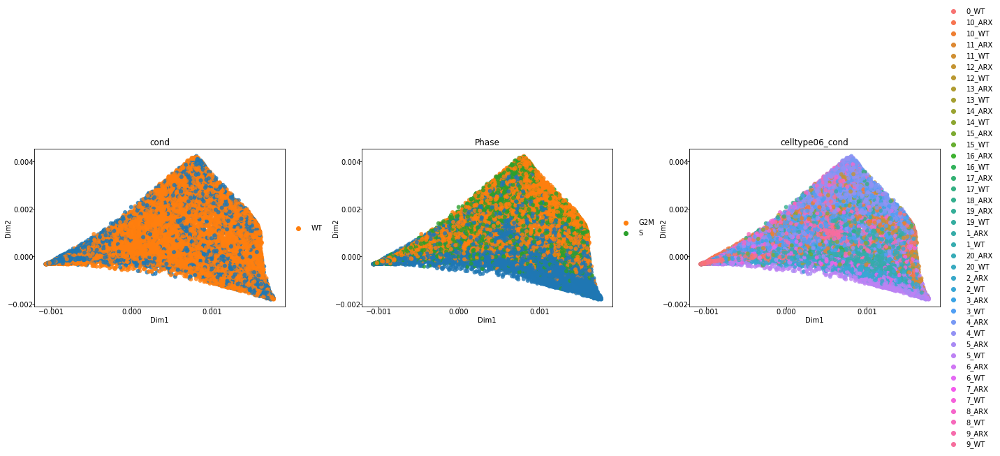

In [9]:
st.plot_dimension_reduction(adata,color=['cond','Phase','celltype06_cond'],
                            n_components=2,show_graph=False,show_text=False)

In [10]:
st.seed_elastic_principal_graph(adata,n_clusters=20)

Seeding initial elastic principal graph...
Clustering...
K-Means clustering ...
The number of initial nodes is 20
Calculatng minimum spanning tree...
Number of initial branches: 9


/home/spuccio/anaconda3/envs/env_stream/lib/python3.7/site-packages/stream/core.py:1505: UserWarning: Tight layout not applied. The bottom and top margins cannot be made large enough to accommodate all axes decorations. 
  plt.tight_layout(pad=pad, h_pad=h_pad, w_pad=w_pad)


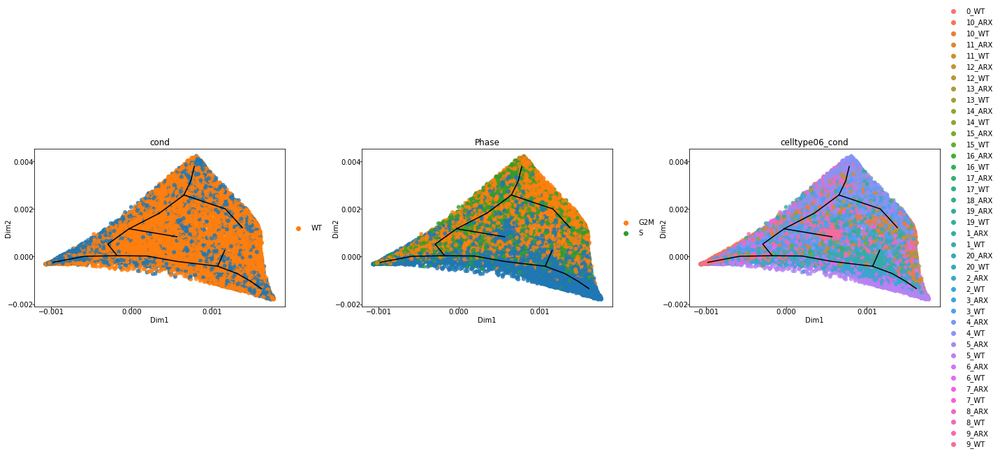

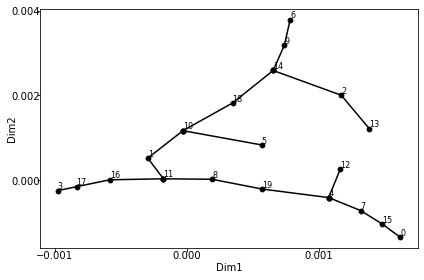

In [11]:
st.plot_dimension_reduction(adata,color=['cond','Phase','celltype06_cond'],n_components=2,show_graph=True,show_text=False)
st.plot_branches(adata,show_text=True)

In [12]:
st.elastic_principal_graph(adata,epg_alpha=0.01,epg_mu=0.05,epg_lambda=0.05)

epg_n_nodes is too small. It is corrected to the initial number of nodes plus incr_n_nodes
Learning elastic principal graph...
[1]
 "Constructing tree 1 of 1 / Subset 1 of 1"


[1]
 "Computing EPG with 50 nodes on 76281 points and 2 dimensions"


[1]
 "Using a single core"


Nodes = 
20
 
21
 
22
 
23
 
24
 
25
 
26
 
27
 
28
 
29
 
30
 
31
 
32
 
33
 
34
 
35
 
36
 
37
 
38
 
39
 
40
 
41
 
42
 
43
 
44
 
45
 
46
 
47
 
48
 
49
 


BARCODE	ENERGY	NNODES	NEDGES	NRIBS	NSTARS	NRAYS	NRAYS2	MSE	MSEP	FVE	FVEP	UE	UR	URN	URN2	URSD

1||50
	
8.812e-08
	
50
	
49
	
46
	
1
	
0
	
0
	
3.95e-08
	
3.854e-08
	
0.9783
	
0.9788
	
4.699e-08
	
1.637e-09
	
8.186e-08
	
4.093e-06
	
0


254.389 sec elapsed

[[1]]



Number of branches after learning elastic principal graph: 3


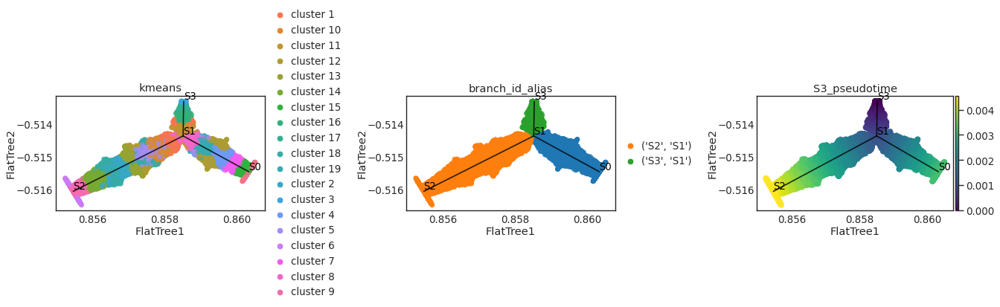

In [19]:
st.plot_flat_tree(adata,color=['kmeans','branch_id_alias','S3_pseudotime'],
                  dist_scale=0.5,show_graph=True,show_text=True)

In [39]:
adata.obs['RNA_snn_res.0.6'] = adata.obs['RNA_snn_res.0.6'].astype('str')

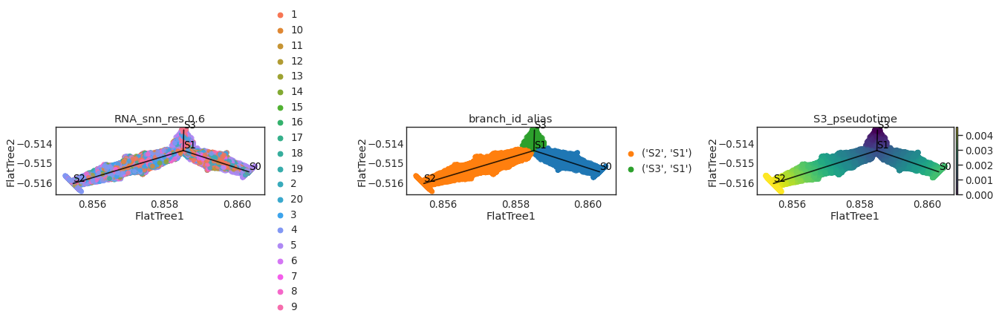

In [40]:
st.plot_flat_tree(adata,color=['RNA_snn_res.0.6','branch_id_alias','S3_pseudotime'],
                  dist_scale=0.5,show_graph=True,show_text=True)

In [17]:
adata.obs

,orig.ident,nCount_RNA,nFeature_RNA,percent.mt,Phase,UMAP_1,UMAP_2,RNA_snn_res.0.6,cond,celltype06_cond,kmeans,node,branch_id,branch_id_alias,branch_lam,branch_dist,S0_pseudotime,S3_pseudotime,S2_pseudotime,S1_pseudotime
TopoARX-12_AAACCCAAGAGAGTTT,TopoARX-12,10740,3492,5.474860,G1,3.939224,-5.379279,1,ARX,1_ARX,cluster 7,12,"(40, 6)","(S0, S1)",0.000478,2.033896e-05,0.000478,0.002701,0.005134,0.001646
TopoARX-12_AAACCCAAGATAACAC,TopoARX-12,1154,780,2.772964,G2M,6.584834,-4.172314,2,ARX,2_ARX,cluster 17,8,"(2, 6)","(S3, S1)",0.000186,2.810277e-07,0.002993,0.000186,0.004357,0.000869
TopoARX-12_AAACCCAAGGCCTAAG,TopoARX-12,1121,735,2.497770,G1,3.946420,-0.910552,0,ARX,0_ARX,cluster 17,9,"(2, 6)","(S3, S1)",0.000084,5.622343e-06,0.003095,0.000084,0.004459,0.000971
TopoARX-12_AAACCCACAACACACT,TopoARX-12,1342,887,1.788376,G2M,4.343887,-3.545111,2,ARX,2_ARX,cluster 17,8,"(2, 6)","(S3, S1)",0.000162,2.147727e-05,0.003017,0.000162,0.004381,0.000893
TopoARX-12_AAACCCACAACCTAAC,TopoARX-12,1246,803,3.290530,S,3.606139,2.586692,0,ARX,0_ARX,cluster 3,9,"(2, 6)","(S3, S1)",0.000062,1.045888e-06,0.003116,0.000062,0.004481,0.000993
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
TopoWT-A_TTTGTCATCAGTTCGA,TopoWT-A,9078,3340,1.553206,S,-7.221295,3.716389,4,WT,4_WT,cluster 9,37,"(37, 6)","(S2, S1)",0.000000,1.210896e-04,0.005612,0.004543,0.000000,0.003488
TopoWT-A_TTTGTCATCCAAGCCG,TopoWT-A,4841,2166,3.098533,G1,4.577340,-5.856477,1,WT,1_WT,cluster 19,5,"(40, 6)","(S0, S1)",0.001360,1.487443e-04,0.001360,0.001819,0.004251,0.000764
TopoWT-A_TTTGTCATCCGCATAA,TopoWT-A,5643,2379,2.711324,G1,4.914593,-3.348634,2,WT,2_WT,cluster 15,17,"(40, 6)","(S0, S1)",0.000223,1.503942e-04,0.000223,0.002956,0.005389,0.001901
TopoWT-A_TTTGTCATCGGTTAAC,TopoWT-A,1057,631,16.177862,G1,1.553934,0.925929,0,WT,0_WT,cluster 3,2,"(2, 6)","(S3, S1)",0.000000,5.373196e-05,0.003179,0.000000,0.004543,0.001055


### Bar plot RNA_snn_res.0.6

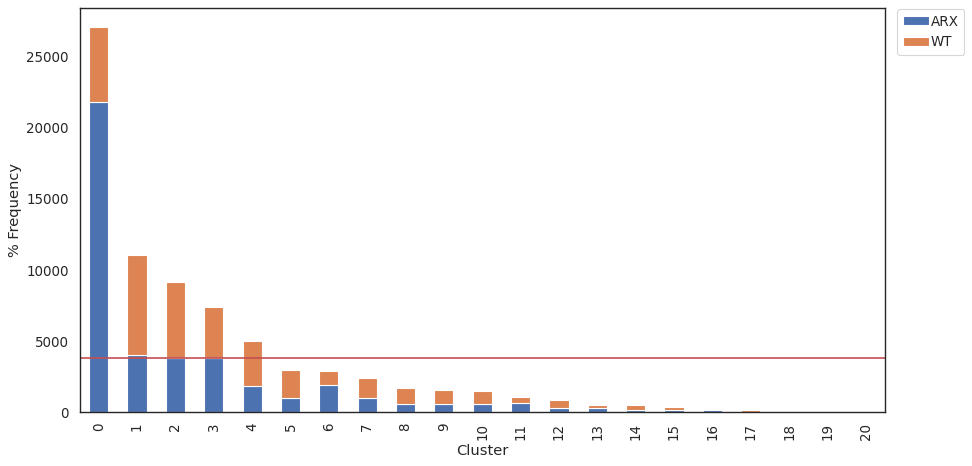

In [33]:
fig, (ax1) = plt.subplots(1,1, figsize=(33/2.54, 17/2.54))
ax1 = adata.obs.groupby("RNA_snn_res.0.6")["cond"].value_counts(normalize=False).unstack().plot.bar(stacked=True,legend=False,ax=ax1)
ax1.set_xlabel("Cluster")
ax1.set_ylabel("% Frequency")
ax1.grid(False)
ax1.legend(bbox_to_anchor=(1.1, 1.0))
plt.axhline(y = 3800, color = 'r', linestyle = '-')

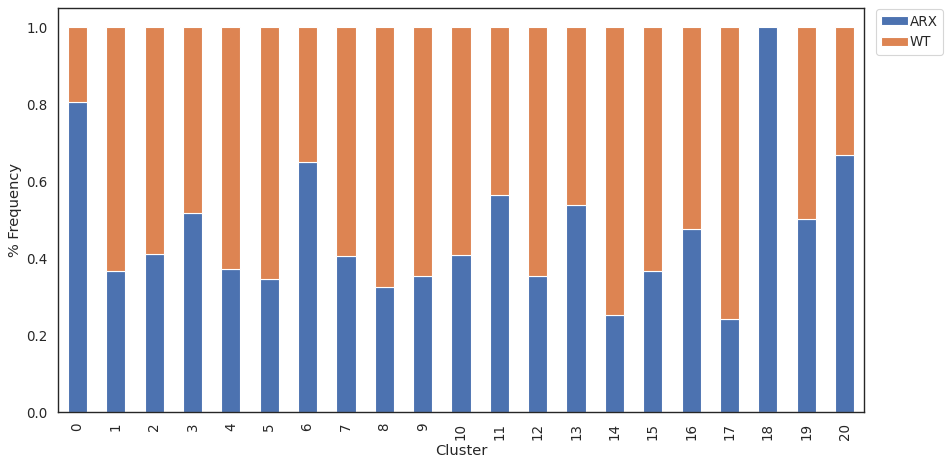

In [29]:
fig, (ax1) = plt.subplots(1,1, figsize=(33/2.54, 17/2.54))
ax1 = adata.obs.groupby("RNA_snn_res.0.6")["cond"].value_counts(normalize=True).unstack().plot.bar(stacked=True,legend=False,ax=ax1)
ax1.set_xlabel("Cluster")
ax1.set_ylabel("% Frequency")
ax1.grid(False)
ax1.legend(bbox_to_anchor=(1.1, 1.0))

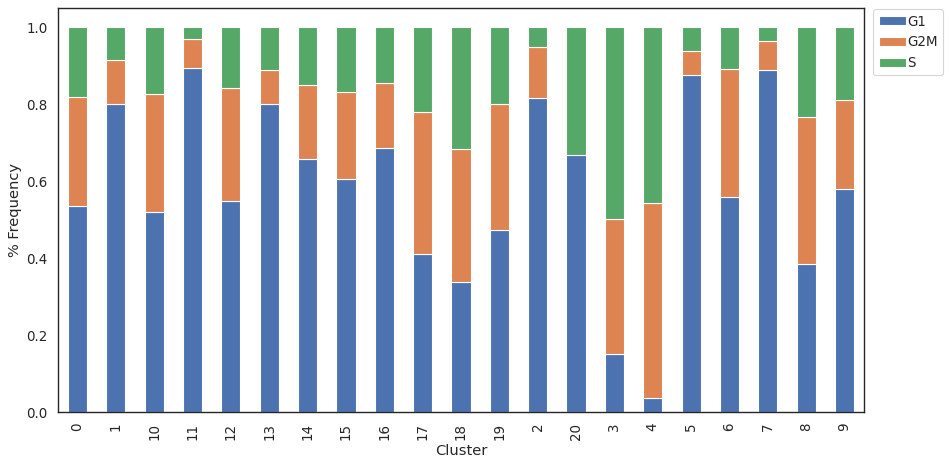

In [121]:
fig, (ax1) = plt.subplots(1,1, figsize=(33/2.54, 17/2.54))
ax1 = adata.obs.groupby("RNA_snn_res.0.6")["Phase"].value_counts(normalize=True).unstack().plot.bar(stacked=True,legend=False,ax=ax1)
ax1.set_xlabel("Cluster")
ax1.set_ylabel("% Frequency")
ax1.grid(False)
ax1.legend(bbox_to_anchor=(1.1, 1.0))

### Bar plot kmeans (STEAM cluster)

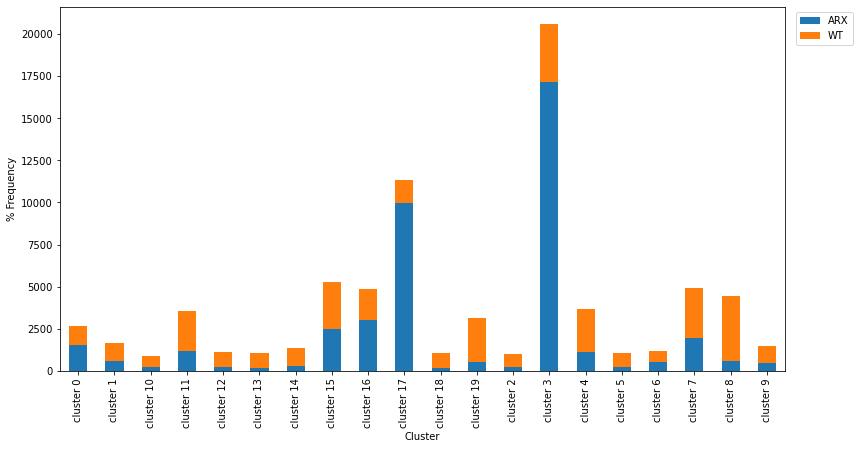

In [9]:
fig, (ax1) = plt.subplots(1,1, figsize=(33/2.54, 17/2.54))
ax1 = adata.obs.groupby("kmeans")["cond"].value_counts(normalize=False).unstack().plot.bar(stacked=True,legend=False,ax=ax1)
ax1.set_xlabel("Cluster")
ax1.set_ylabel("% Frequency")
ax1.grid(False)
ax1.legend(bbox_to_anchor=(1.1, 1.0))

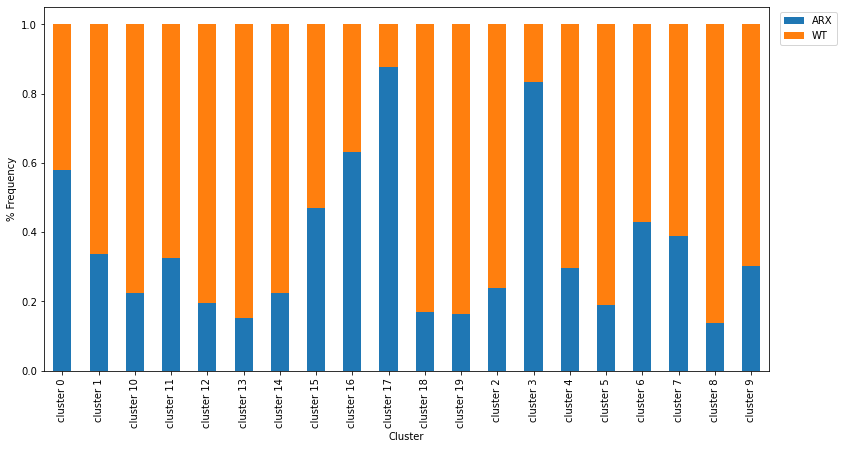

In [10]:
fig, (ax1) = plt.subplots(1,1, figsize=(33/2.54, 17/2.54))
ax1 = adata.obs.groupby("kmeans")["cond"].value_counts(normalize=True).unstack().plot.bar(stacked=True,legend=False,ax=ax1)
ax1.set_xlabel("Cluster")
ax1.set_ylabel("% Frequency")
ax1.grid(False)
ax1.legend(bbox_to_anchor=(1.1, 1.0))

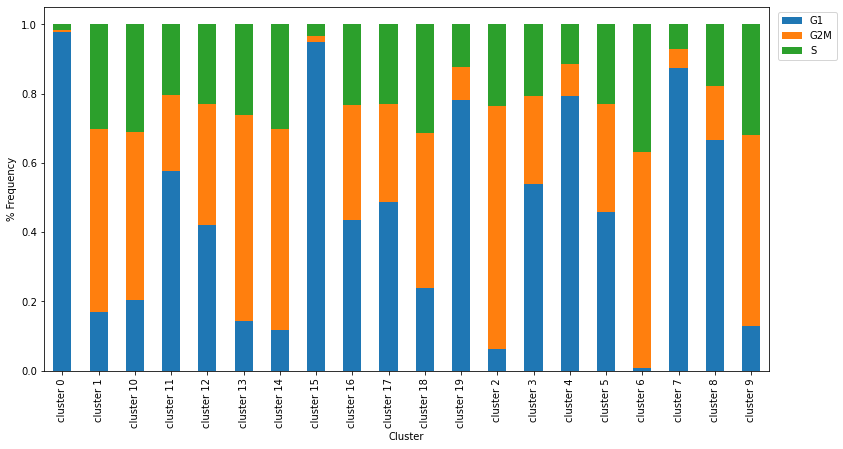

In [11]:
fig, (ax1) = plt.subplots(1,1, figsize=(33/2.54, 17/2.54))
ax1 = adata.obs.groupby("kmeans")["Phase"].value_counts(normalize=True).unstack().plot.bar(stacked=True,legend=False,ax=ax1)
ax1.set_xlabel("Cluster")
ax1.set_ylabel("% Frequency")
ax1.grid(False)
ax1.legend(bbox_to_anchor=(1.1, 1.0))

In [46]:
adata_cluster0 = adata[adata.obs['RNA_snn_res.0.6']  == '0',:]

In [49]:
adata_cluster3 = adata[adata.obs['RNA_snn_res.0.6']  == '3',:]

In [50]:
adata_cluster4 = adata[adata.obs['RNA_snn_res.0.6']  == '4',:]

In [51]:
adata_cluster8 = adata[adata.obs['RNA_snn_res.0.6']  == '8',:]

In [53]:
adata_cluster12 = adata[adata.obs['RNA_snn_res.0.6']  == '12',:]

## Cluster 0 

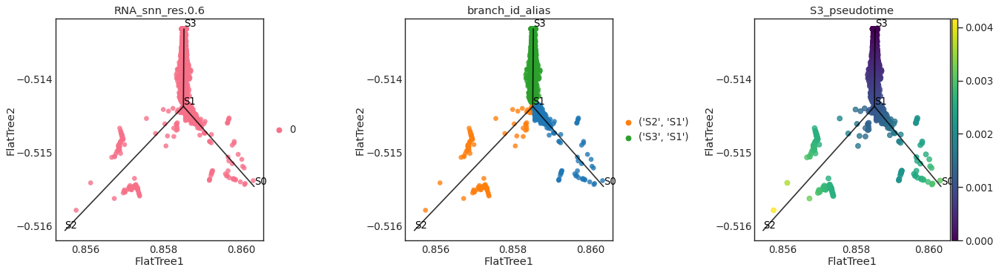

In [48]:
st.plot_flat_tree(adata_cluster0,color=['RNA_snn_res.0.6','branch_id_alias','S3_pseudotime'],
                  dist_scale=0.5,show_graph=True,show_text=True)

### Cluster 3

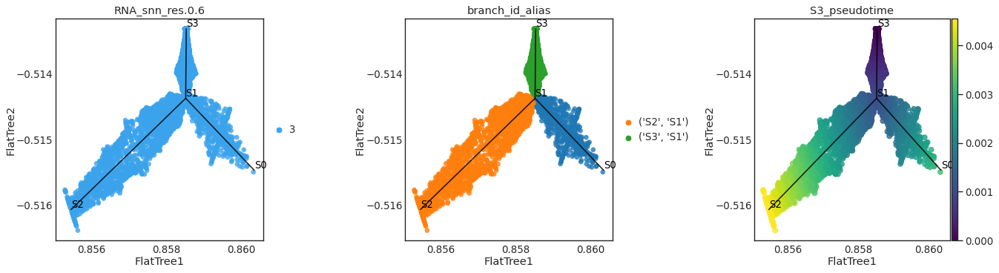

In [54]:
st.plot_flat_tree(adata_cluster3,color=['RNA_snn_res.0.6','branch_id_alias','S3_pseudotime'],
                  dist_scale=0.5,show_graph=True,show_text=True)

### Cluster 4

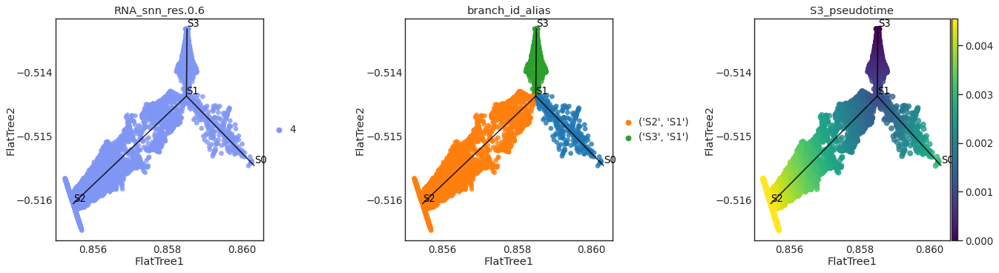

In [55]:
st.plot_flat_tree(adata_cluster4,color=['RNA_snn_res.0.6','branch_id_alias','S3_pseudotime'],
                  dist_scale=0.5,show_graph=True,show_text=True)

### Clsuter 8

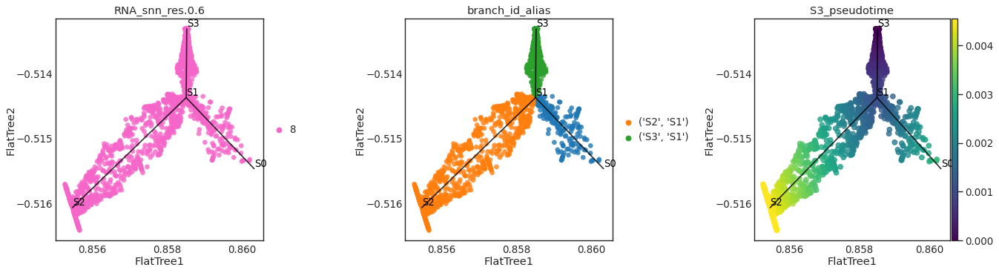

In [56]:
st.plot_flat_tree(adata_cluster8,color=['RNA_snn_res.0.6','branch_id_alias','S3_pseudotime'],
                  dist_scale=0.5,show_graph=True,show_text=True)

### Cluster 12 

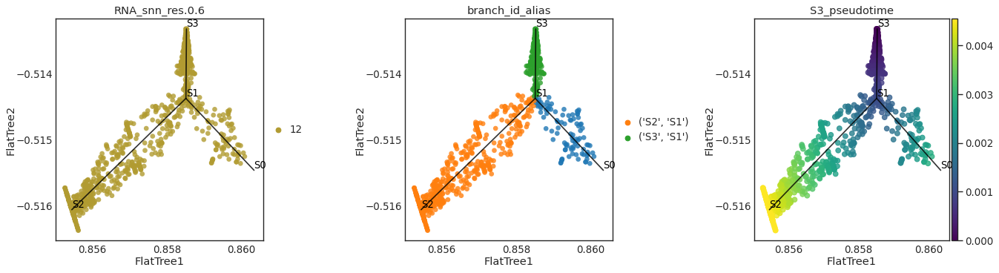

In [57]:
st.plot_flat_tree(adata_cluster12,color=['RNA_snn_res.0.6','branch_id_alias','S3_pseudotime'],
                  dist_scale=0.5,show_graph=True,show_text=True)

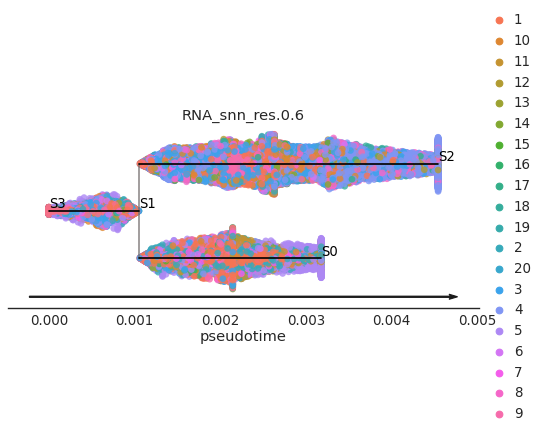

In [58]:
st.plot_stream_sc(adata,root='S3',color=['RNA_snn_res.0.6'],
                  dist_scale=0.3,show_graph=True,show_text=True)

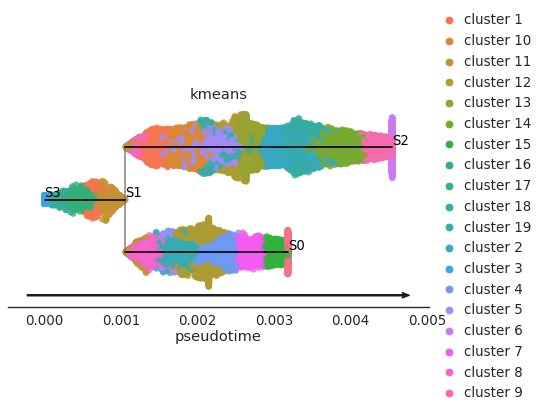

In [59]:
st.plot_stream_sc(adata,root='S3',color=['kmeans'],
                  dist_scale=0.3,show_graph=True,show_text=True)

In [ ]:
st.plot_stream_sc(adata,root='S3',color=['kmeans','cond'],
                  dist_scale=0.3,show_graph=True,show_text=True)

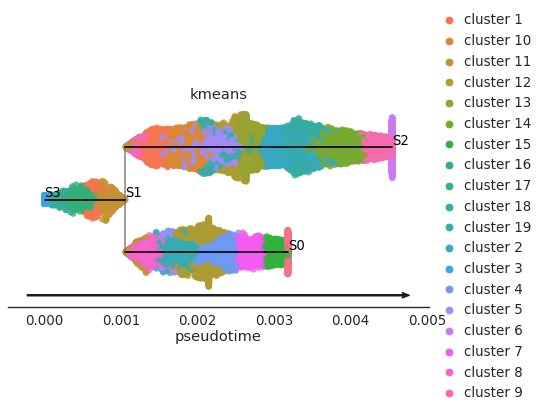

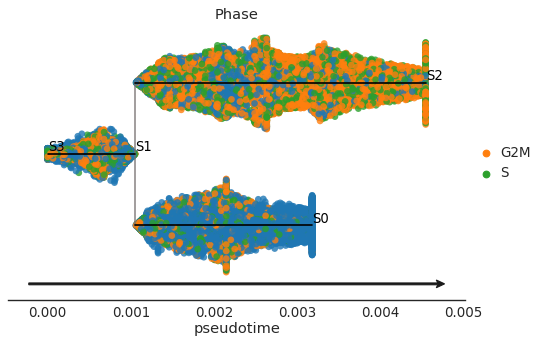

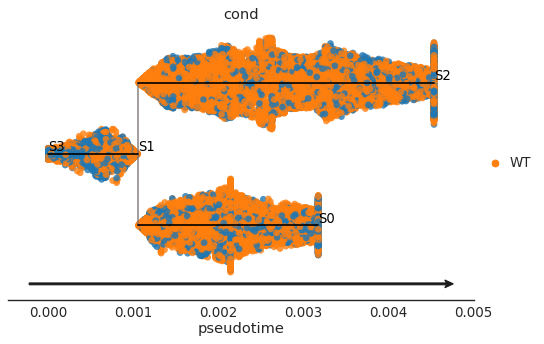

In [66]:
st.plot_stream_sc(adata,root='S3',color=['kmeans','Phase','cond'],
                  dist_scale=0.3,show_graph=True,show_text=True)

In [12]:
st.plot_stream_sc(adata,root='S3',color=['kmeans','Arx'],
                  dist_scale=0.3,show_graph=True,show_text=True,plotly=True)

## 1) detect marker genes for each leaf branch

In [72]:
st.detect_leaf_markers(adata,marker_list=adata.uns['var_genes'],cutoff_zscore=1.0,cutoff_pvalue=0.01,
                       root='S3',n_jobs=24)

Scanning the specified marker list ...
Importing precomputed scaled marker expression matrix ...
843 markers are being scanned ...


/home/spuccio/anaconda3/envs/env_stream/lib/python3.7/site-packages/stream/scikit_posthocs.py:169: VisibleDeprecationWarning:

Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.

/home/spuccio/anaconda3/envs/env_stream/lib/python3.7/site-packages/stream/scikit_posthocs.py:185: VisibleDeprecationWarning:

Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.

/home/spuccio/anaconda3/envs/env_stream/lib/python3.7/site-packages/stream/scikit_posthocs.py:169: VisibleDeprecationWarning:

Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes)

In [94]:
adata.uns['leaf_markers'][('S3','S1')].to_csv("/home/spuccio/marker_genes_leaf_S3_S1.csv",sep="\t",header=True,index=True)

In [95]:
adata.uns['leaf_markers'][('S1','S2')].to_csv("/home/spuccio/marker_genes_leaf_S1_S2.csv",sep="\t",header=True,index=True)

In [96]:
adata.uns['leaf_markers'][('S1','S0')].to_csv("/home/spuccio/marker_genes_leaf_S1_S0.csv",sep="\t",header=True,index=True)

## 2) detect transition genes for each branch

In [79]:
st.detect_transition_markers(adata,marker_list=adata.uns['var_genes'],cutoff_spearman=0.4,cutoff_logfc=0.25,
                             root='S3',n_jobs=24)

Scanning the specified marker list ...
Importing precomputed scaled marker expression matrix ...
843 markers are being scanned ...


In [97]:
adata.uns['transition_markers'][('S3','S1')].to_csv("/home/spuccio/transition_genes_S3_S1.csv",sep="\t",header=True,index=True)

In [88]:
adata.uns['transition_markers'][('S1','S0')]

,stat,logfc,pval,qval


In [98]:
adata.uns['transition_markers'][('S1','S2')].to_csv("/home/spuccio/transition_genes_S1_S2.csv",sep="\t",header=True,index=True)

In [ ]:
adata.uns['transition_markers'][('S1','S2')]

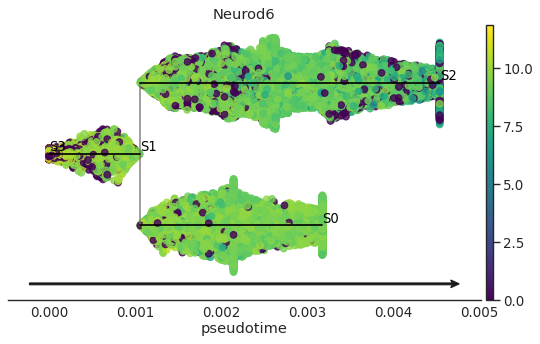

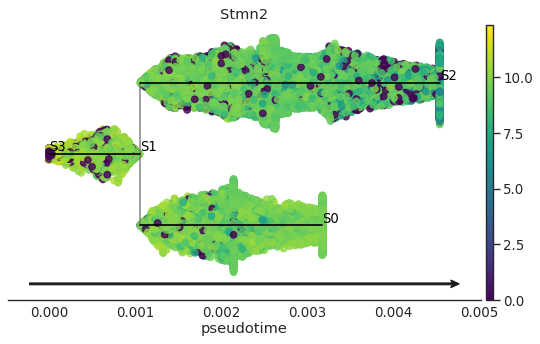

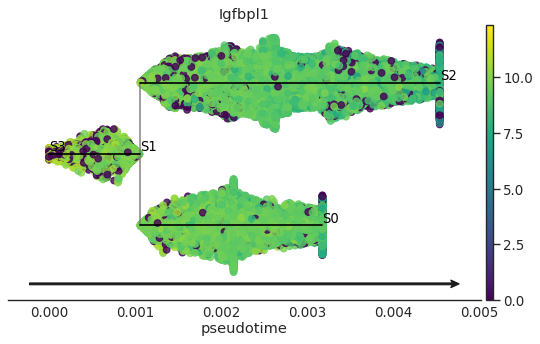

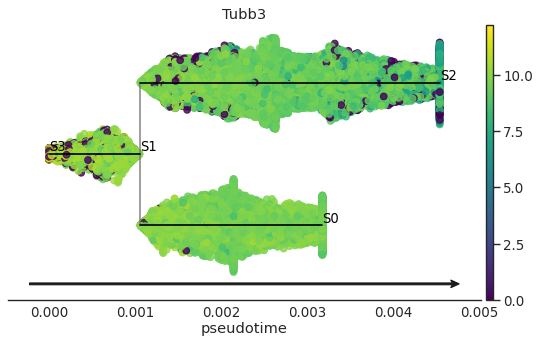

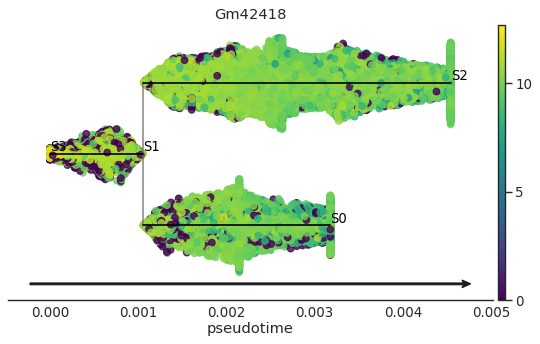

In [91]:
st.plot_stream_sc(adata,root='S3',color=['Neurod6','Stmn2','Igfbpl1','Tubb3','Gm42418'],
                  dist_scale=0.3,show_graph=True,show_text=True)


### 3) detect marker genes that are differentially expressed between pairs of branches

In [92]:
st.detect_de_markers(adata,marker_list=adata.uns['var_genes'],cutoff_zscore=1,cutoff_logfc=0.25,
                     root='S3',n_jobs=24)

Scanning the specified marker list ...
Importing precomputed scaled marker expression matrix ...
843 markers are being scanned ...


In [33]:
adata.uns['de_markers_greater'][(('S1', 'S2'), ('S1', 'S0'))].to_csv("/home/spuccio/differentially_expressed_between_pairs_of_branches_S1_S2_vs_S1_S0_up.csv",sep="\t",header=True,index=True)

In [34]:
adata.uns['de_markers_less'][(('S1', 'S2'), ('S1', 'S0'))].to_csv("/home/spuccio/differentially_expressed_between_pairs_of_branches_S1_S2_vs_S1_S0_up.csv",sep="\t",header=True,index=True)

In [35]:
adata.uns['de_markers_greater'][(('S3', 'S1'), ('S1', 'S0'))].to_csv("/home/spuccio/differentially_expressed_between_pairs_of_branches_S3_S1_vs_S1_S0_up.csv",sep="\t",header=True,index=True)

In [36]:
adata.uns['de_markers_greater'][(('S3', 'S1'), ('S1', 'S0'))].to_csv("/home/spuccio/differentially_expressed_between_pairs_of_branches_S3_S1_vs_S1_S0_down.csv",sep="\t",header=True,index=True)

In [37]:
adata.uns['de_markers_greater'][(('S3', 'S1'), ('S1', 'S0'))].to_csv("/home/spuccio/differentially_expressed_between_pairs_of_branches_S3_S1_vs_S1_S2_up.csv",sep="\t",header=True,index=True)

In [38]:
adata.uns['de_markers_less'][(('S3', 'S1'), ('S1', 'S2'))].to_csv("/home/spuccio/differentially_expressed_between_pairs_of_branches_S3_S1_vs_S1_S2_down.csv",sep="\t",header=True,index=True)

### 4) detect cell population-specific markers

In [112]:
st.detect_markers(adata,ident='kmeans',marker_list=adata.uns['var_genes'],cutoff_zscore=1.0,cutoff_pvalue=0.05,n_jobs=24)

Scanning the specified marker list ...
Importing precomputed scaled marker expression matrix ...
843 markers are being scanned ...


/home/spuccio/anaconda3/envs/env_stream/lib/python3.7/site-packages/stream/scikit_posthocs.py:169: VisibleDeprecationWarning:

Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.

/home/spuccio/anaconda3/envs/env_stream/lib/python3.7/site-packages/stream/scikit_posthocs.py:185: VisibleDeprecationWarning:

Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.

/home/spuccio/anaconda3/envs/env_stream/lib/python3.7/site-packages/stream/scikit_posthocs.py:169: VisibleDeprecationWarning:

Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes)

In [113]:
for i in range(0,20):
    adata.uns['markers_kmeans'][('cluster '+str(i))].to_csv(f"/home/spuccio/cell_population_specific_markers_{i}.csv",sep="\t",header=True,index=True)

In [117]:
st.write(adata,file_name='stream_result2.pkl')

In [120]:
adata

AnnData object with n_obs × n_vars = 76281 × 16846
    obs: 'orig.ident', 'nCount_RNA', 'nFeature_RNA', 'percent.mt', 'Phase', 'UMAP_1', 'UMAP_2', 'RNA_snn_res.0.6', 'cond', 'celltype06_cond', 'kmeans', 'node', 'branch_id', 'branch_id_alias', 'branch_lam', 'branch_dist', 'S0_pseudotime', 'S3_pseudotime', 'S2_pseudotime', 'S1_pseudotime'
    uns: 'workdir', 'var_genes', 'trans_se', 'params', 'Phase_color', 'cond_color', 'celltype06_cond_color', 'epg', 'flat_tree', 'seed_epg', 'seed_flat_tree', 'ori_epg', 'epg_obj', 'ori_epg_obj', 'branch_id_alias_color', 'kmeans_color', 'RNA_snn_res.0.6_color', 'stream_S3', 'scaled_marker_expr', 'leaf_markers_all', 'leaf_markers', 'transition_markers', 'de_markers_greater', 'de_markers_less', 'markers_kmeans_all', 'markers_kmeans'
    obsm: 'var_genes', 'X_se', 'X_dr', 'X_spring', 'X_stream_S3'